### Условие задачи

**Дано:**
- твердое тело, в массе которого распространяется тепло от нескольких источников
- тело - куб $[0, L] \times [0, L] \times [0, L]$ с коэффициентом диффузии $D = 1.0$
- в центре куба расположен шар радиуса $R = \dfrac{L}{5}$ с низким коэффициентом диффузии $D_R = 10^{-16}$
- $T_0 = 0$ - начальная температура во всем объеме куба
- граничные условия на гранях куба двух видов:
    - фиксированная температура на гранях
        - $x = 0$
        - $y = L$
    - абсолютная теплоизоляция на гранях
        - $x = L$
        - $y = 0$ 
        - $z = 0$
        - $z = L$ 
- в массе куба расположены источники тепла, мощность которых меняется по периодическому закону $\dot{q}_i = p_i \cdot (\sin(\dfrac{2\pi}{\theta_i}t + \phi_i) + 1)$

    - пластина 0:
        - центр $(0.2L, 0.5L, 0.5L)$
        - размеры (от центра до края) $(4/dx, 0.2L, 0.2L)$
        - $p_0 = 100$, $\theta_0 = 50$, $\phi_0 = 0$
        
    - пластина 1:
        - центр $(0.5L, 0.2L, 0.5L)$
        - размеры (от центра до края) $(0.2L, 4/dx, 0.2L)$
        - $p_0 = 100$, $\theta_0 = 77$, $\phi_0 = 10$
    
- координаты проб, для которых необходимо построить графики изменения температуры от времени
    - проба 0: $(0.3L, 0.3L, 0.5L)$
    - проба 1: $(0.3L, 0.7L, 0.5L)$
    - проба 2: $(0.7L, 0.7L, 0.5L)$
    - проба 3: $(0.7L, 0.3L, 0.5L)$
    
- $dx$ - шаг пространственного разбиения по всем трем измерениям
- $t_m = 600$ c - общее время моделирования

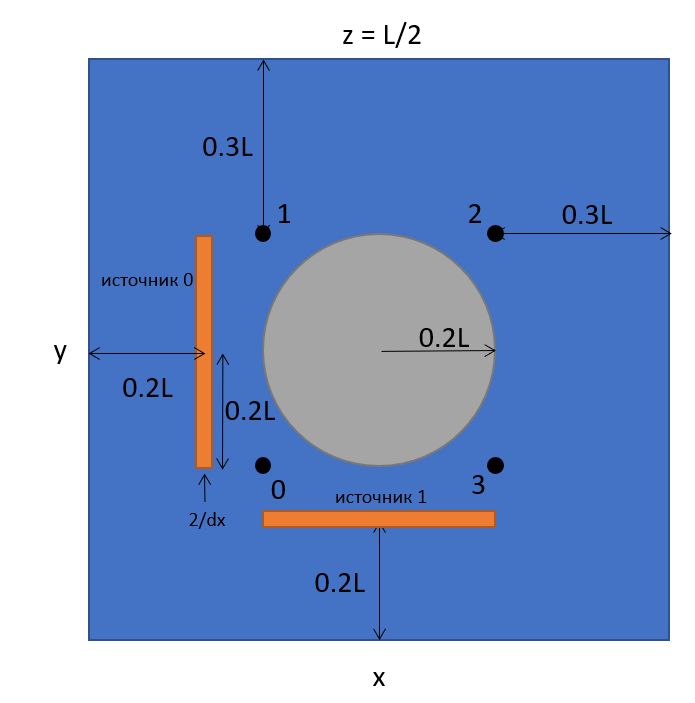
<center>Рис. 1. Сечение тела плоскостью z=L/2</center>


**Требуется:**
- согласно уравнению диффузии смоделировать распространение тепла в кубе на заданное время $t_m$ при:
    - $L = 100$
    - $(dx, dt) \in [(4, 0.2), (2, 0.1), (1, 0.05), (0.5, 0.025)]$
    
    
- для каждой пары $(dx, dt)$:
    1. вывести время расчета
    
    2. сохранить в файл(ы) и использовать в пунктах 3-5:
        - температурное поле в конечный момент времени
        - замеры температуры в местах установки проб

    3. построить цветовую карту в конечный момент времени в сечении $z = 0.5L$
        - подписать оси,
        - отобразить цветовую шкалу (colorbar),
        - отобразить пробы в виде точек и подписать их номера.

    4. на одном рисунке построить графики температур в местах установки проб
        - подписать оси,
        - вывести легенду.

    5. используя быстрое преобразование Фурье, восстановить периоды колебаний температуры в местах установки проб
        - `np.fft.rfft`, `np.fft.rfftfreq`, `scipy.signal.find_peaks`
    

**Описание:**

Распространение тепла можно описать при помощи уравнения диффузии (уравнение с частными производными):

$\frac{\partial{T}}{\partial{t}} = D \left(\frac{\partial^2{T}}{\partial{x^2}} + \frac{\partial^2{T}}{\partial{y^2}} + \frac{\partial^2{T}}{\partial{z^2}} \right) + \dot{q}$, где

- $T(t, x, y, z)$ - поле температур
- $D(x, y, z)$ - коэффициент диффузии
- $\dot q(t, x, y, z)$ - функция источников тепла

Для решения нестационарной задачи распространения тепла рассматриваемое тело представляют в виде сетки с равномерным шагом, а дифференциальное уравнение заменяют на конечно-разностное. Рассмотрим схему `FTCS`, т.е. производная по времени заменяется на правую разность (Forward Time), а вторая производная по пространственным переменным заменяется на центральную разность (Central Space).

$\frac{\partial{T}}{\partial{t}} \rightarrow \frac{T^{n}_{i,j,k} - T^{n-1}_{i,j,k}}{dt}$

$\frac{\partial^2{T}}{\partial{x^2}} \rightarrow \frac{T^{n-1}_{i-1,j,k} - 2T^{n-1}_{i,j,k} + T^{n-1}_{i+1,j,k}}{dx^2}, ...$


$\frac{T^{n}_{i,j} - T^{n-1}_{i,j}}{dt} = \frac{D_{i,j}}{dx^2} \left(T^{n-1}_{i-1,j,k} + T^{n-1}_{i+1,j,k} + T^{n-1}_{i,j-1,k}  + T^{n-1}_{i,j+1,k} + T^{n-1}_{i,j,k-1} + T^{n-1}_{i,j,k+1} - 6T^{n-1}_{i,j,k}\right) + \dot{q}$

Итоговая рекуррентная формула для вычисления температуры в момент времени $n \cdot dt$ в ячейке сетки $(i, j, k)$ на основании данных в момент времени $(n-1) \cdot dt$:

$T^{n}_{i,j} = T^{n-1}_{i,j} + \frac{dt D_{i,j,k}}{dx^2} \left(T^{n-1}_{i-1,j,k} + T^{n-1}_{i+1,j,k} + T^{n-1}_{i,j-1,k}  + T^{n-1}_{i,j+1,k} + T^{n-1}_{i,j,k-1} + T^{n-1}_{i,j,k+1} - 6T^{n-1}_{i,j,k}\right) + dt \cdot \dot{q}^{n}_{i,j,k}$

Временной шаг $dt$ должен быть таким, чтобы учитывать условие Курранта: $dt = \frac{C \cdot dx}{D}$, где $C$ - число Курранта.

В этой задаче рассматриваются граничные условия двух видов - фиксированная температура и абсолютная теплоизоляция. Оба вида граничных условий указаны на гранях куба. Таким образом, расчет распространения тепла выполняется для всех ячеек сетки, за исключением расположенных на гранях куба, т.е. $i, j, k \in (0, N-1)$, где $N = L / dx$.
Граничное условие в виде фиксированной температуры записывается в соответствующие граням куба ячейки сетки. 

Например, для грани $x = 0$: $T^{n}_{0,j,k} = T_*$, грани $x = L$: $T^{n}_{N-1,j,k} = T_*$. 


Граничное условие в виде абсолютной теплоизоляции означает, что через заданную грань нет потока тепла, а это достижимо, если температура в ячейках грани и прилегающим к ним ячейкам одинаковая. 

Например, $x = 0$: $T^{n}_{0,j,k} = T^{n}_{1,j,k}$, грани $x = L$: $T^{n}_{N-1,j,k} = T^{n}_{N-2,j,k}$.


**Материалы:**

- [Уравнение теплопроводности](https://ru.wikipedia.org/wiki/Уравнение_теплопроводности)
- [Solving 2D heat equation numerically using python](https://levelup.gitconnected.com/solving-2d-heat-equation-numerically-using-python-3334004aa01a)
- [Diffusion Eq 2D with Source](https://www.youtube.com/watch?v=aCRYfvh_bnY)

In [1]:
import numpy as np
import holoviews as hv
from holoviews import opts
import time
from tqdm import tqdm
from numba import njit, prange
from scipy.signal import find_peaks
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
@njit(boundscheck=False)
def hot(t, cube, dx, dt):
    ti = (t+1) % 2
    tj = t % 2
    d=0
    count = int(L/dx)
    ball_center = int((L/2)/dx)
    radius = int((L/5)/dx)
    
    for i in prange(1, count):
        for j in prange(1, count):
            for k in prange(1, count):
                d = D
                if (i-ball_center)**2 + (j-ball_center)**2 + (k-ball_center)**2 <= radius**2:
                      d = Dr
                cube[ti, i, j, k] = cube[tj, i, j, k] + dt * d / dx**2 * (
                    cube[tj, i-1, j, k] + cube[tj, i+1, j, k] + 
                    cube[tj, i, j-1, k] + cube[tj, i, j+1, k] + 
                    cube[tj, i, j, k+1] + cube[tj, i, j, k-1] - 6*cube[tj, i, j, k]) 
        
    cube[ti, :, count, :] = cube[ti, :, count-1, :] # x = L
    cube[ti, 0, :, :] = cube[ti, 1, :, :] # y = 0
    cube[ti, :, :, 0] = cube[ti, :, :, 1] # z = 0
    cube[ti, :, :, count] = cube[ti, :, :, count-1] # z = L
    return cube

In [3]:
def temperature_initialization(t, cube, dx, dt):
    cube[:, pc1[0]-ps1[0]:pc1[0]+ps1[0]+1, pc1[1]-ps1[1]:pc1[1]+ps1[1]+1, pc1[2]-ps1[2]:pc1[2]+ps1[2]+1] += dt * p1 * (np.sin(2*np.pi/theta1 * t*dt + phi1) + 1)
    cube[:, pc2[0]-ps2[0]:pc2[0]+ps2[0]+1, pc2[1]-ps2[1]:pc2[1]+ps2[1]+1, pc2[2]-ps2[2]:pc2[2]+ps2[2]+1] += dt * p2 * (np.sin(2*np.pi/theta2 * t*dt + phi2) + 1)
    cube = hot(t, cube, dx, dt)
    ti = (t+1) % 2
    Temperature_probe0[t] = cube[ti, probe0[0], probe0[1], probe0[2]]
    Temperature_probe1[t] = cube[ti, probe1[0], probe1[1], probe1[2]]
    Temperature_probe2[t] = cube[ti, probe2[0], probe2[1], probe2[2]]
    Temperature_probe3[t] = cube[ti, probe3[0], probe3[1], probe3[2]]
    return cube

In [4]:
save_directory = 'Programming Python/heat_transfer_problem_dir/cube_case_'
cases = [(4, 0.2), (2, 0.1), (1, 0.05), (0.5, 0.025), (0.25, 0.01)]
p1, theta1, phi1 = 100, 50, 0
p2, theta2, phi2 = 100, 77, 10
L = 100
D, Dr = 1, 1e-16
timings = 600

iteration_number = 0

for case in cases:
    print('=====================================')
    print(f'Processing case {case}')
    dx, dt = case[0], case[1]
    iterations = int(timings/dt)  
#     print(int(L/dx) + 1, iterations, ball_center, radius)
    
    # Сoordinates of the center of the plate 1
    pc1 = np.array([0.5*L/dx, 0.2*L/dx, 0.5*L/dx], dtype=int)
    # Plate 1 size
    ps1 = np.array([0.2*L/dx, 4/dx, 0.2*L/dx], dtype=int) 
    # Coordinates of the center of the plate 2
    pc2 = np.array([0.2*L/dx, 0.5*L/dx, 0.5*L/dx], dtype=int)
    # Plate 2 size
    ps2 = np.array([4/dx, 0.2*L/dx, 0.2*L/dx], dtype=int) 

    # Probe coordinates
    probe0 = np.array([0.3*L/dx, 0.3*L/dx, 0.5*L/dx], dtype=int)
    probe1 = np.array([0.7*L/dx, 0.3*L/dx, 0.5*L/dx], dtype=int)
    probe2 = np.array([0.7*L/dx, 0.7*L/dx, 0.5*L/dx], dtype=int)
    probe3 = np.array([0.3*L/dx, 0.7*L/dx, 0.5*L/dx], dtype=int)

    # Temperature probes 
    Temperature_probe0 = np.zeros(iterations, dtype=float)
    Temperature_probe1 = np.zeros(iterations, dtype=float)
    Temperature_probe2 = np.zeros(iterations, dtype=float)
    Temperature_probe3 = np.zeros(iterations, dtype=float)
    
    cube = np.zeros((2, int(L/dx) + 1, int(L/dx) + 1, int(L/dx) + 1), dtype=float)
    time_start = time.time()
    for t in tqdm(prange(iterations)):
        cube = temperature_initialization(t, cube, dx, dt)
    print('Saving started')
    np.savez(save_directory + str(iteration_number), cube=cube[1], 
             probe0=Temperature_probe0, probe1=Temperature_probe1, probe2=Temperature_probe2, probe3=Temperature_probe3)
    print('Saving finished')
    whole_time = time.time()-time_start
    print(f'Time of calculating and saving: {whole_time}s for cube with shape {cube.shape} and dx={dx} dt={dt}')
    print('=====================================\n\n')
    iteration_number += 1
    cube = 0

  0%|          | 0/3000 [00:00<?, ?it/s]

Processing case (4, 0.2)


  3%|▎         | 206/6000 [00:00<00:02, 2053.08it/s]

Saving started
Saving finished
Time of calculating and saving: 0.9101970195770264s for cube with shape (2, 26, 26, 26) and dx=4 dt=0.2


Processing case (2, 0.1)


  0%|          | 24/12000 [00:00<00:50, 238.00it/s]

Saving started
Saving finished
Time of calculating and saving: 2.942728042602539s for cube with shape (2, 51, 51, 51) and dx=2 dt=0.1


Processing case (1, 0.05)


  0%|          | 0/24000 [00:00<?, ?it/s]

Saving started
Saving finished
Time of calculating and saving: 44.98000168800354s for cube with shape (2, 101, 101, 101) and dx=1 dt=0.05


Processing case (0.5, 0.025)


100%|██████████| 24000/24000 [13:06<00:00, 30.51it/s]


Saving started


  0%|          | 0/60000 [00:00<?, ?it/s]

Saving finished
Time of calculating and saving: 786.858179807663s for cube with shape (2, 201, 201, 201) and dx=0.5 dt=0.025


Processing case (0.25, 0.01)


100%|██████████| 60000/60000 [4:20:46<00:00,  3.83it/s]  


Saving started
Saving finished
Time of calculating and saving: 15646.648563861847s for cube with shape (2, 401, 401, 401) and dx=0.25 dt=0.01




### Downloading and plotting data

## Case 0

In [5]:
data = np.load('Programming Python/heat_transfer_problem_dir/cube_case_0.npz')
dx, dt = 4, 0.2
L = 100

cd = data['cube']
print(cd.shape)
p0 = data['probe0']
p1 = data['probe1']
p2 = data['probe2']
p3 = data['probe3']

probe0 = np.array([0.3*L/dx, 0.3*L/dx, 0.5*L/dx], dtype=int)
probe1 = np.array([0.7*L/dx, 0.3*L/dx, 0.5*L/dx], dtype=int)
probe2 = np.array([0.7*L/dx, 0.7*L/dx, 0.5*L/dx], dtype=int)
probe3 = np.array([0.3*L/dx, 0.7*L/dx, 0.5*L/dx], dtype=int)
cnt = cd.shape[0]

(26, 26, 26)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
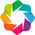

:Overlay
   .Image.I       :Image   [x,y]   (z)
   .Points.Probe0 :Points   [x,y]
   .Points.Probe1 :Points   [x,y]
   .Points.Probe2 :Points   [x,y]
   .Points.Probe3 :Points   [x,y]

In [6]:
hv.extension('bokeh')
img = hv.Image(cd[:, :, int(cnt/2)], bounds=(0, 0, cnt, cnt)).opts(width=700, height=450, cmap='fire', colorbar=True, invert_yaxis=True)
point0 = hv.Points([img.closest((probe0[1], cnt-probe0[0]))], label='probe0').opts(color='blue', size=15, marker='x')
point1 = hv.Points([img.closest((probe1[1], cnt-probe1[0]))], label='probe1').opts(color='yellow', size=15, marker='x')
point2 = hv.Points([img.closest((probe2[1], cnt-probe2[0]))], label='probe2').opts(color='aqua', size=15, marker='x')
point3 = hv.Points([img.closest((probe3[1], cnt-probe3[0]))], label='probe3').opts(color='pink', size=15, marker='x')
points = point0 * point1 * point2 * point3
final_image = img * points
final_image.opts(fontsize=11)

<AxesSubplot:>

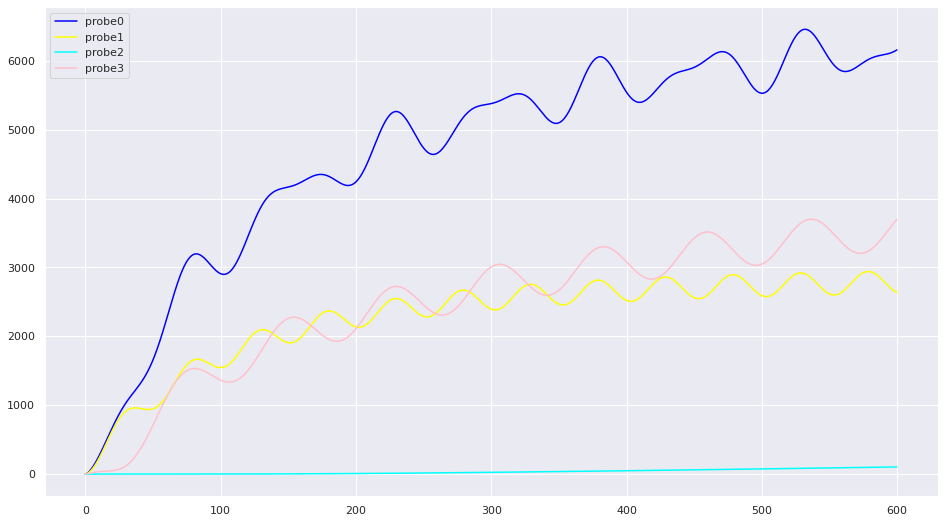

In [7]:
x = np.arange(0, timings, dt)

plt.figure(figsize = (16,9))
sns.set(style='darkgrid')

sns.lineplot(x=x, y=p0, label='probe0', color='blue')
sns.lineplot(x=x, y=p1, label='probe1', color='yellow')
sns.lineplot(x=x, y=p2, label='probe2', color='aqua')
sns.lineplot(x=x, y=p3, label='probe3', color='pink')

Periods of sourses are: [600.  50.]
Periods of sourses are: [600.  50.]
Periods of sourses are: [600.]
Periods of sourses are: [600.  75.]


<AxesSubplot:>

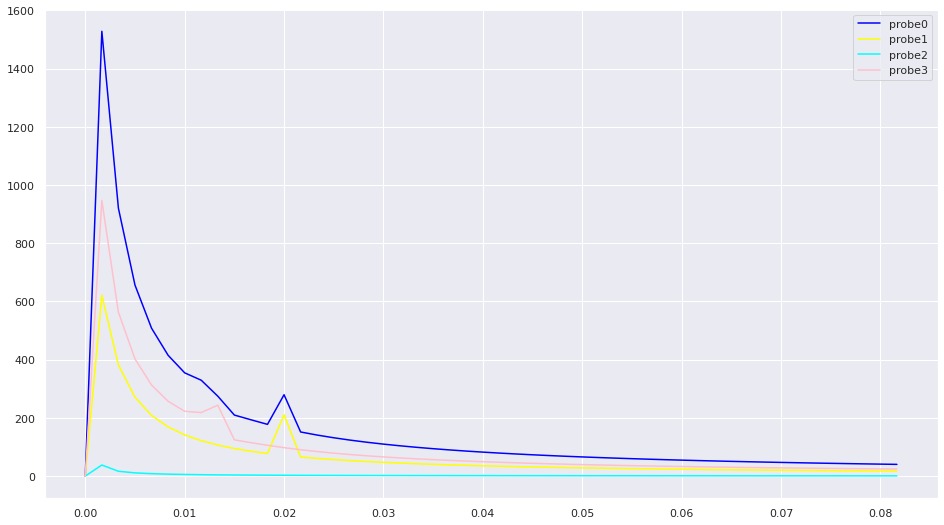

In [8]:
N = p0.shape[0]
k = 0
amplitude_array = []
freqs = []
for p in [p0, p1, p2, p3]:
    amp = np.abs(np.fft.rfft(p - p.mean()))/(N/2)
    amplitude_array.append(amp)
    freq = np.fft.rfftfreq(N, dt)
    freqs.append(freq)
    idx, _ = find_peaks(amp[:50])
    print(f'Periods of sourses are: {1/freq[idx]}')

plt.figure(figsize = (16,9))
sns.set(style='darkgrid')
sns.lineplot(x=freqs[0][:50], y=amplitude_array[0][:50], label='probe0', color='blue')
sns.lineplot(x=freqs[1][:50], y=amplitude_array[1][:50], label='probe1', color='yellow')
sns.lineplot(x=freqs[2][:50], y=amplitude_array[2][:50], label='probe2', color='aqua')
sns.lineplot(x=freqs[3][:50], y=amplitude_array[3][:50], label='probe3', color='pink')

## Case 1

In [9]:
data = np.load('Programming Python/heat_transfer_problem_dir/cube_case_1.npz')
dx, dt = 2, 0.1
L = 100

cd = data['cube']

print(cd.shape)
p0 = data['probe0']
p1 = data['probe1']
p2 = data['probe2']
p3 = data['probe3']

probe0 = np.array([0.3*L/dx, 0.3*L/dx, 0.5*L/dx])
probe1 = np.array([0.7*L/dx, 0.3*L/dx, 0.5*L/dx])
probe2 = np.array([0.7*L/dx, 0.7*L/dx, 0.5*L/dx])
probe3 = np.array([0.3*L/dx, 0.7*L/dx, 0.5*L/dx])
cnt = cd.shape[0]

(51, 51, 51)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
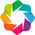

:Overlay
   .Image.I       :Image   [x,y]   (z)
   .Points.Probe0 :Points   [x,y]
   .Points.Probe1 :Points   [x,y]
   .Points.Probe2 :Points   [x,y]
   .Points.Probe3 :Points   [x,y]

In [10]:
hv.extension('bokeh')
img = hv.Image(cd[:, :, int(cnt/2)], bounds=(0, 0, cnt, cnt)).opts(width=700, height=450, cmap='fire', colorbar=True, invert_yaxis=True)
point0 = hv.Points([img.closest((probe0[1], cnt-probe0[0]))], label='probe0').opts(color='blue', size=15, marker='x')
point1 = hv.Points([img.closest((probe1[1], cnt-probe1[0]))], label='probe1').opts(color='yellow', size=15, marker='x')
point2 = hv.Points([img.closest((probe2[1], cnt-probe2[0]))], label='probe2').opts(color='aqua', size=15, marker='x')
point3 = hv.Points([img.closest((probe3[1], cnt-probe3[0]))], label='probe3').opts(color='pink', size=15, marker='x')
points = point0 * point1 * point2 * point3
final_image = img * points
final_image.opts(fontsize=11)

<AxesSubplot:>

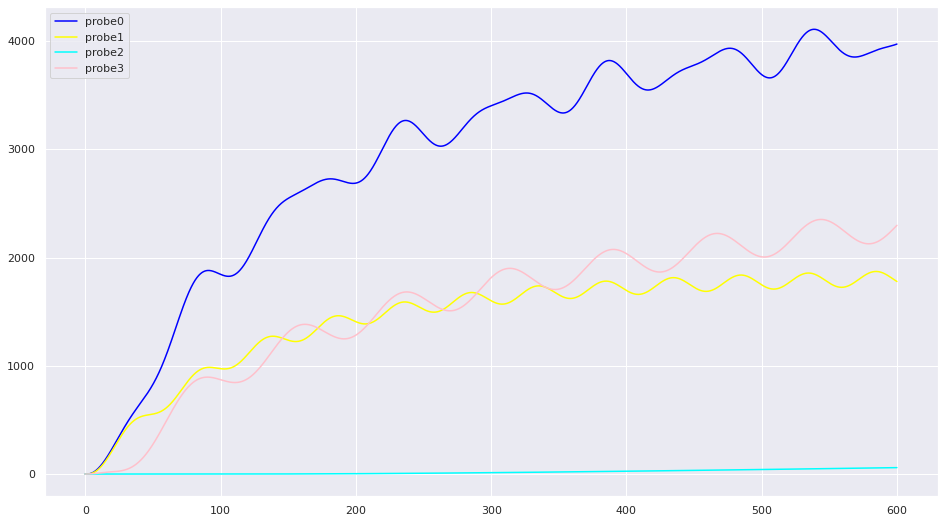

In [11]:
x = np.arange(0, timings, dt)

plt.figure(figsize = (16,9))
sns.set(style='darkgrid')

sns.lineplot(x=x, y=p0, label='probe0', color='blue')
sns.lineplot(x=x, y=p1, label='probe1', color='yellow')
sns.lineplot(x=x, y=p2, label='probe2', color='aqua')
sns.lineplot(x=x, y=p3, label='probe3', color='pink')

Periods of sourses are: [600.          66.66666667  50.        ]
Periods of sourses are: [600.  50.]
Periods of sourses are: [600.]
Periods of sourses are: [600.]


<AxesSubplot:>

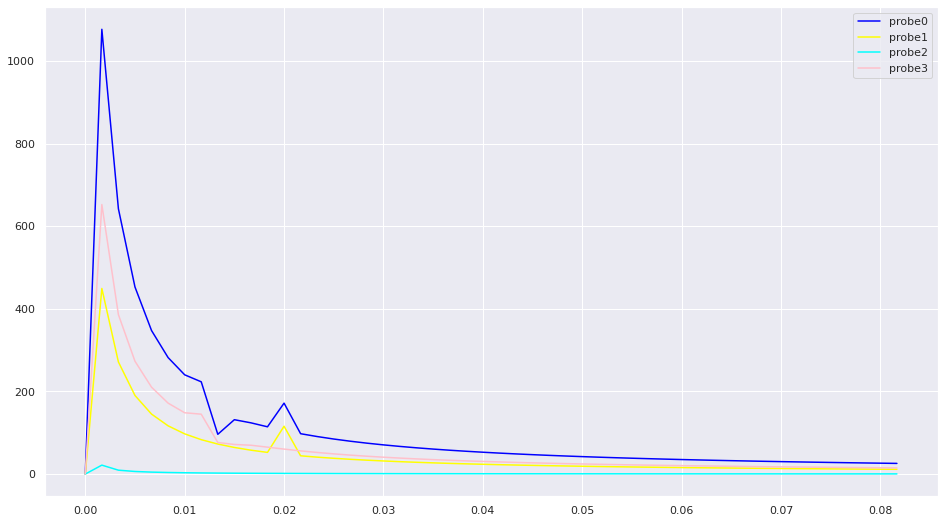

In [12]:
N = p0.shape[0]
k = 0
amplitude_array = []
freqs = []
for p in [p0, p1, p2, p3]:
    amp = np.abs(np.fft.rfft(p - p.mean()))/(N/2)
    amplitude_array.append(amp)
    freq = np.fft.rfftfreq(N, dt)
    freqs.append(freq)
    idx, _ = find_peaks(amp[:50])
    print(f'Periods of sourses are: {1/freq[idx]}')

plt.figure(figsize = (16,9))
sns.set(style='darkgrid')
sns.lineplot(x=freqs[0][:50], y=amplitude_array[0][:50], label='probe0', color='blue')
sns.lineplot(x=freqs[1][:50], y=amplitude_array[1][:50], label='probe1', color='yellow')
sns.lineplot(x=freqs[2][:50], y=amplitude_array[2][:50], label='probe2', color='aqua')
sns.lineplot(x=freqs[3][:50], y=amplitude_array[3][:50], label='probe3', color='pink')

## Case 2

In [13]:
data = np.load('Programming Python/heat_transfer_problem_dir/cube_case_2.npz')
dx, dt = 1, 0.05
L = 100

cd = data['cube']
print(cd.shape)
p0 = data['probe0']
p1 = data['probe1']
p2 = data['probe2']
p3 = data['probe3']

probe0 = np.array([0.3*L/dx, 0.3*L/dx, 0.5*L/dx])
probe1 = np.array([0.7*L/dx, 0.3*L/dx, 0.5*L/dx])
probe2 = np.array([0.7*L/dx, 0.7*L/dx, 0.5*L/dx])
probe3 = np.array([0.3*L/dx, 0.7*L/dx, 0.5*L/dx])
cnt = cd.shape[0]

(101, 101, 101)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
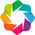

:Overlay
   .Image.I       :Image   [x,y]   (z)
   .Points.Probe0 :Points   [x,y]
   .Points.Probe1 :Points   [x,y]
   .Points.Probe2 :Points   [x,y]
   .Points.Probe3 :Points   [x,y]

In [14]:
hv.extension('bokeh')
img = hv.Image(cd[:, :, int(cnt/2)], bounds=(0, 0, cnt, cnt)).opts(width=700, height=450, cmap='fire', colorbar=True, invert_yaxis=True)
point0 = hv.Points([img.closest((probe0[1], cnt-probe0[0]))], label='probe0').opts(color='blue', size=15, marker='x')
point1 = hv.Points([img.closest((probe1[1], cnt-probe1[0]))], label='probe1').opts(color='yellow', size=15, marker='x')
point2 = hv.Points([img.closest((probe2[1], cnt-probe2[0]))], label='probe2').opts(color='aqua', size=15, marker='x')
point3 = hv.Points([img.closest((probe3[1], cnt-probe3[0]))], label='probe3').opts(color='pink', size=15, marker='x')
points = point0 * point1 * point2 * point3
final_image = img * points
final_image.opts(fontsize=11)

<AxesSubplot:>

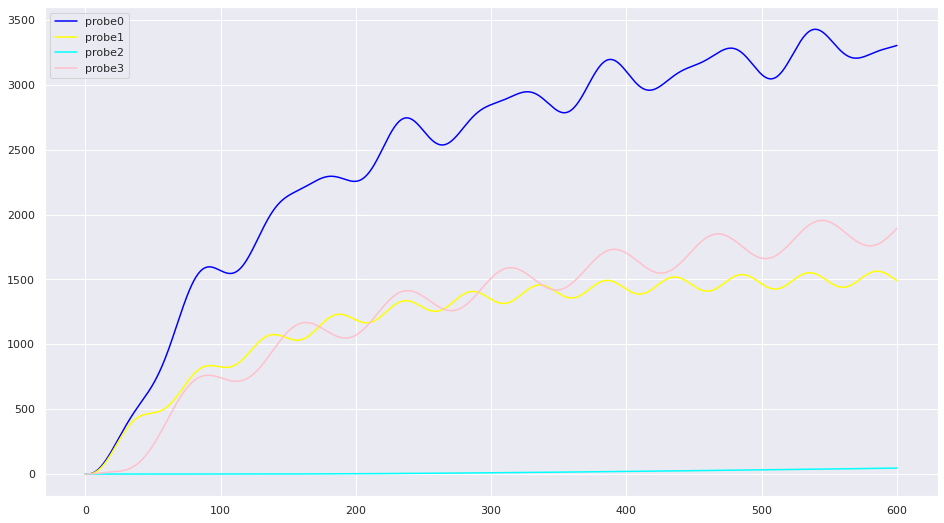

In [15]:
x = np.arange(0, timings, dt)

plt.figure(figsize = (16,9))
sns.set(style='darkgrid')

sns.lineplot(x=x, y=p0, label='probe0', color='blue')
sns.lineplot(x=x, y=p1, label='probe1', color='yellow')
sns.lineplot(x=x, y=p2, label='probe2', color='aqua')
sns.lineplot(x=x, y=p3, label='probe3', color='pink')

Periods of sourses are: [600.          66.66666667  50.        ]
Periods of sourses are: [600.  50.]
Periods of sourses are: [600.]
Periods of sourses are: [600.]


<AxesSubplot:>

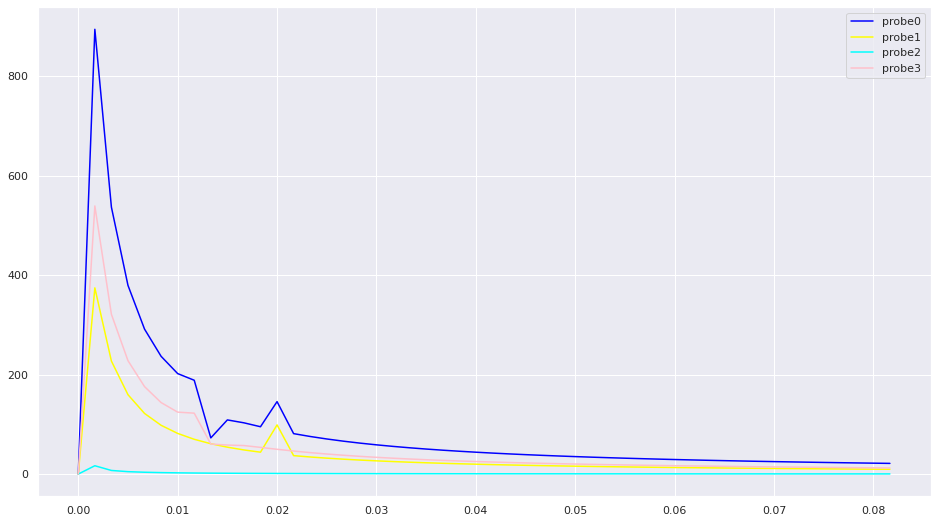

In [16]:
N = p0.shape[0]
k = 0
amplitude_array = []
freqs = []
for p in [p0, p1, p2, p3]:
    amp = np.abs(np.fft.rfft(p - p.mean()))/(N/2)
    amplitude_array.append(amp)
    freq = np.fft.rfftfreq(N, dt)
    freqs.append(freq)
    idx, _ = find_peaks(amp[:50])
    print(f'Periods of sourses are: {1/freq[idx]}')

plt.figure(figsize = (16,9))
sns.set(style='darkgrid')
sns.lineplot(x=freqs[0][:50], y=amplitude_array[0][:50], label='probe0', color='blue')
sns.lineplot(x=freqs[1][:50], y=amplitude_array[1][:50], label='probe1', color='yellow')
sns.lineplot(x=freqs[2][:50], y=amplitude_array[2][:50], label='probe2', color='aqua')
sns.lineplot(x=freqs[3][:50], y=amplitude_array[3][:50], label='probe3', color='pink')

## Case 3

In [17]:
data = np.load('Programming Python/heat_transfer_problem_dir/cube_case_3.npz')
dx, dt = 0.5, 0.025
L = 100

cd = data['cube']
print(cd.shape)
p0 = data['probe0']
p1 = data['probe1']
p2 = data['probe2']
p3 = data['probe3']

probe0 = np.array([0.3*L/dx, 0.3*L/dx, 0.5*L/dx])
probe1 = np.array([0.7*L/dx, 0.3*L/dx, 0.5*L/dx])
probe2 = np.array([0.7*L/dx, 0.7*L/dx, 0.5*L/dx])
probe3 = np.array([0.3*L/dx, 0.7*L/dx, 0.5*L/dx])
cnt = cd.shape[0]

(201, 201, 201)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
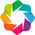

:Overlay
   .Image.I       :Image   [x,y]   (z)
   .Points.Probe0 :Points   [x,y]
   .Points.Probe1 :Points   [x,y]
   .Points.Probe2 :Points   [x,y]
   .Points.Probe3 :Points   [x,y]

In [18]:
hv.extension('bokeh')
img = hv.Image(cd[:, :, int(cnt/2)], bounds=(0, 0, cnt, cnt)).opts(width=700, height=450, cmap='fire', colorbar=True, invert_yaxis=True)
point0 = hv.Points([img.closest((probe0[1], cnt-probe0[0]))], label='probe0').opts(color='blue', size=15, marker='x')
point1 = hv.Points([img.closest((probe1[1], cnt-probe1[0]))], label='probe1').opts(color='yellow', size=15, marker='x')
point2 = hv.Points([img.closest((probe2[1], cnt-probe2[0]))], label='probe2').opts(color='aqua', size=15, marker='x')
point3 = hv.Points([img.closest((probe3[1], cnt-probe3[0]))], label='probe3').opts(color='pink', size=15, marker='x')
points = point0 * point1 * point2 * point3
final_image = img * points
final_image.opts(fontsize=11)

<AxesSubplot:>

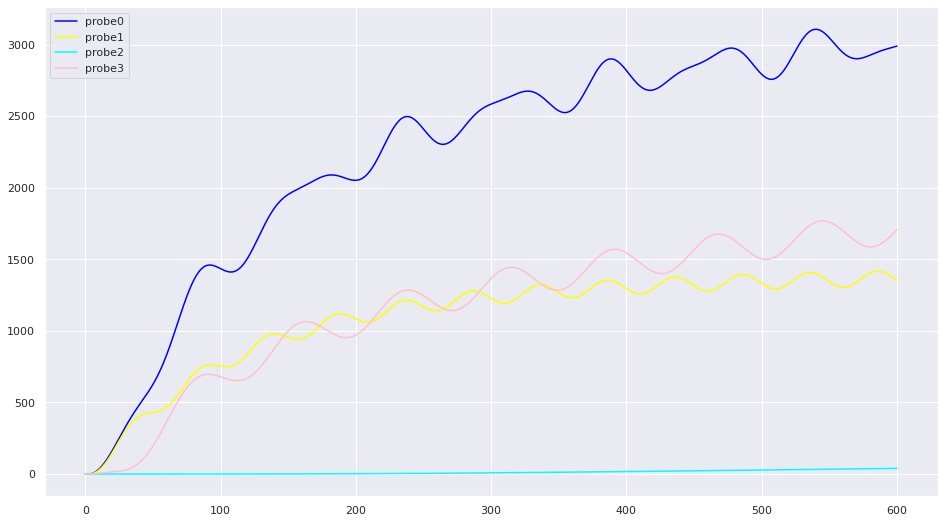

In [19]:
x = np.arange(0, timings, dt)

plt.figure(figsize = (16,9))
sns.set(style='darkgrid')

sns.lineplot(x=x, y=p0, label='probe0', color='blue')
sns.lineplot(x=x, y=p1, label='probe1', color='yellow')
sns.lineplot(x=x, y=p2, label='probe2', color='aqua')
sns.lineplot(x=x, y=p3, label='probe3', color='pink')

Periods of sourses are: [600.          66.66666667  50.        ]
Periods of sourses are: [600.  50.]
Periods of sourses are: [600.]
Periods of sourses are: [600.]


<AxesSubplot:>

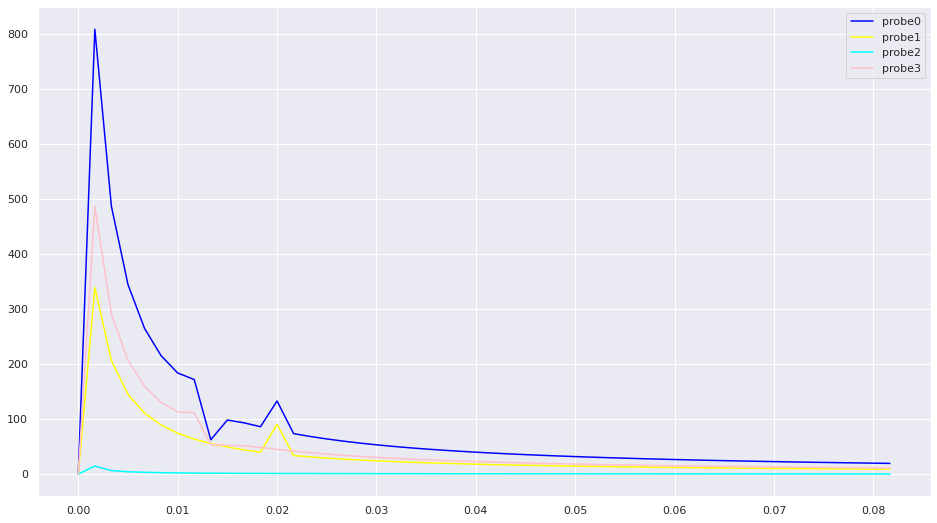

In [20]:
N = p0.shape[0]
k = 0
amplitude_array = []
freqs = []
for p in [p0, p1, p2, p3]:
    amp = np.abs(np.fft.rfft(p - p.mean()))/(N/2)
    amplitude_array.append(amp)
    freq = np.fft.rfftfreq(N, dt)
    freqs.append(freq)
    idx, _ = find_peaks(amp[:50])
    print(f'Periods of sourses are: {1/freq[idx]}')

plt.figure(figsize = (16,9))
sns.set(style='darkgrid')
sns.lineplot(x=freqs[0][:50], y=amplitude_array[0][:50], label='probe0', color='blue')
sns.lineplot(x=freqs[1][:50], y=amplitude_array[1][:50], label='probe1', color='yellow')
sns.lineplot(x=freqs[2][:50], y=amplitude_array[2][:50], label='probe2', color='aqua')
sns.lineplot(x=freqs[3][:50], y=amplitude_array[3][:50], label='probe3', color='pink')

## Case 4 (bonus one)

In [21]:
data = np.load('Programming Python/heat_transfer_problem_dir/cube_case_4.npz')
dx, dt = 0.25, 0.01
L = 100

cd = data['cube']
print(cd.shape)
p0 = data['probe0']
p1 = data['probe1']
p2 = data['probe2']
p3 = data['probe3']

probe0 = np.array([0.3*L/dx, 0.3*L/dx, 0.5*L/dx])
probe1 = np.array([0.7*L/dx, 0.3*L/dx, 0.5*L/dx])
probe2 = np.array([0.7*L/dx, 0.7*L/dx, 0.5*L/dx])
probe3 = np.array([0.3*L/dx, 0.7*L/dx, 0.5*L/dx])
cnt = cd.shape[0]

(401, 401, 401)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
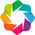

:Overlay
   .Image.I       :Image   [x,y]   (z)
   .Points.Probe0 :Points   [x,y]
   .Points.Probe1 :Points   [x,y]
   .Points.Probe2 :Points   [x,y]
   .Points.Probe3 :Points   [x,y]

In [22]:
hv.extension('bokeh')
img = hv.Image(cd[:, :, int(cnt/2)], bounds=(0, 0, cnt, cnt)).opts(width=700, height=450, cmap='fire', colorbar=True, invert_yaxis=True)
point0 = hv.Points([img.closest((probe0[1], cnt-probe0[0]))], label='probe0').opts(color='blue', size=15, marker='x')
point1 = hv.Points([img.closest((probe1[1], cnt-probe1[0]))], label='probe1').opts(color='yellow', size=15, marker='x')
point2 = hv.Points([img.closest((probe2[1], cnt-probe2[0]))], label='probe2').opts(color='aqua', size=15, marker='x')
point3 = hv.Points([img.closest((probe3[1], cnt-probe3[0]))], label='probe3').opts(color='pink', size=15, marker='x')
points = point0 * point1 * point2 * point3
final_image = img * points
final_image.opts(fontsize=11)

<AxesSubplot:>

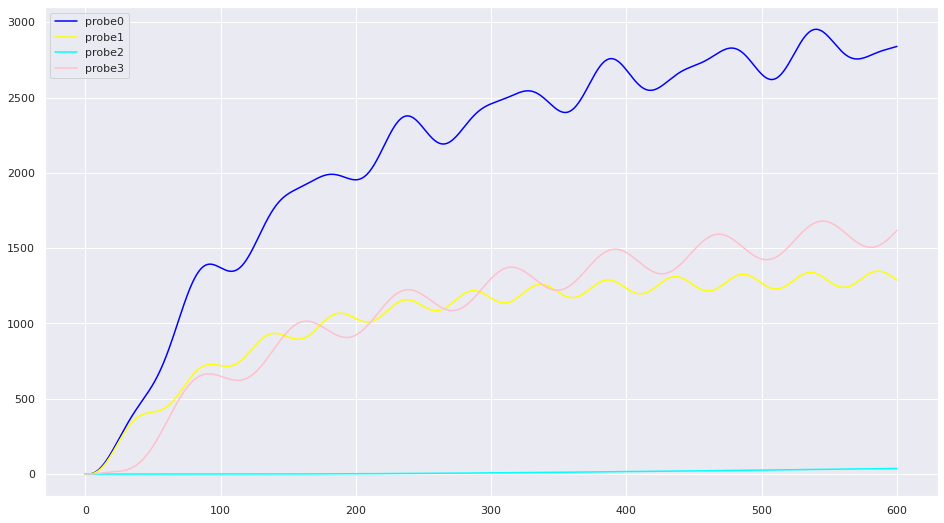

In [23]:
x = np.arange(0, timings, dt)

plt.figure(figsize = (16,9))
sns.set(style='darkgrid')

sns.lineplot(x=x, y=p0, label='probe0', color='blue')
sns.lineplot(x=x, y=p1, label='probe1', color='yellow')
sns.lineplot(x=x, y=p2, label='probe2', color='aqua')
sns.lineplot(x=x, y=p3, label='probe3', color='pink')

Periods of sourses are: [600.          66.66666667  50.        ]
Periods of sourses are: [600.  50.]
Periods of sourses are: [600.]
Periods of sourses are: [600.]


<AxesSubplot:>

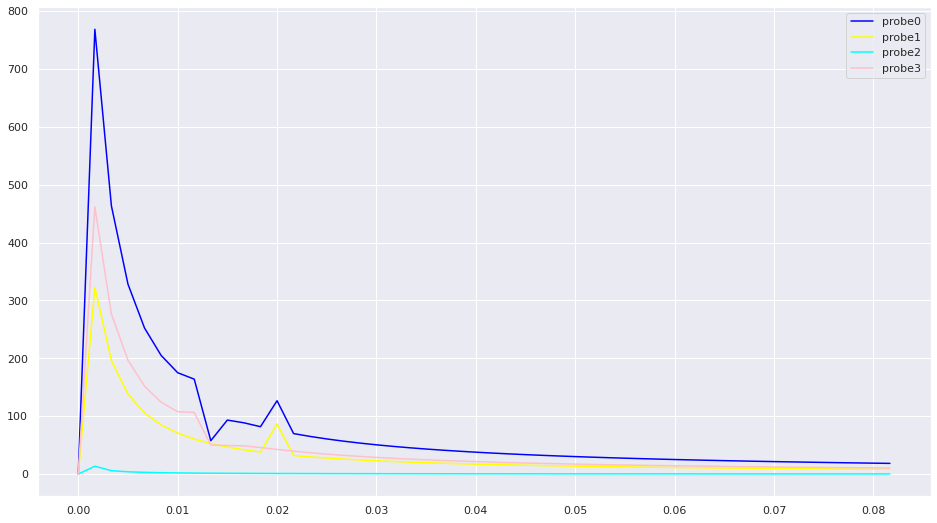

In [24]:
N = p0.shape[0]
k = 0
amplitude_array = []
freqs = []
for p in [p0, p1, p2, p3]:
    amp = np.abs(np.fft.rfft(p - p.mean()))/(N/2)
    amplitude_array.append(amp)
    freq = np.fft.rfftfreq(N, dt)
    freqs.append(freq)
    idx, _ = find_peaks(amp[:50])
    print(f'Periods of sourses are: {1/freq[idx]}')

plt.figure(figsize = (16,9))
sns.set(style='darkgrid')
sns.lineplot(x=freqs[0][:50], y=amplitude_array[0][:50], label='probe0', color='blue')
sns.lineplot(x=freqs[1][:50], y=amplitude_array[1][:50], label='probe1', color='yellow')
sns.lineplot(x=freqs[2][:50], y=amplitude_array[2][:50], label='probe2', color='aqua')
sns.lineplot(x=freqs[3][:50], y=amplitude_array[3][:50], label='probe3', color='pink')